<center> <h1>Visión por Computadora: Stitching</h1> </center>


Gina Martínez López*



In [42]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [43]:
img1=cv2.imread('img1.jpg')
img2=cv2.imread('img2.jpg')
img_rgb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

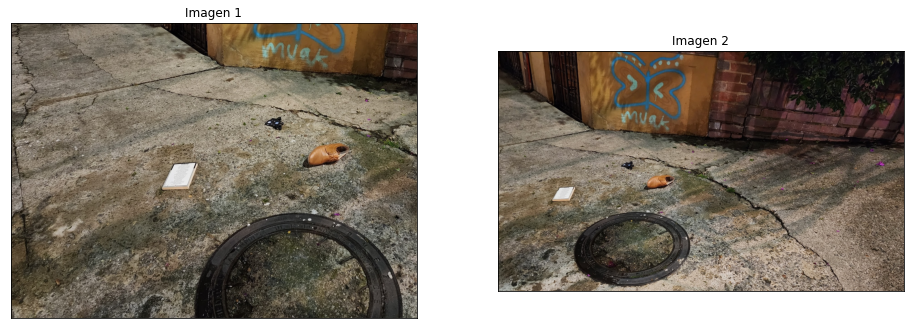

In [44]:
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Imagen 1')
plt.imshow(img_rgb1)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Imagen 2')
plt.imshow(img_rgb2)
plt.xticks([]), plt.yticks([])

plt.show()

In [45]:
img3=cv2.imread('img3.jpg')
img4=cv2.imread('img4.jpg')
img_rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img_rgb4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

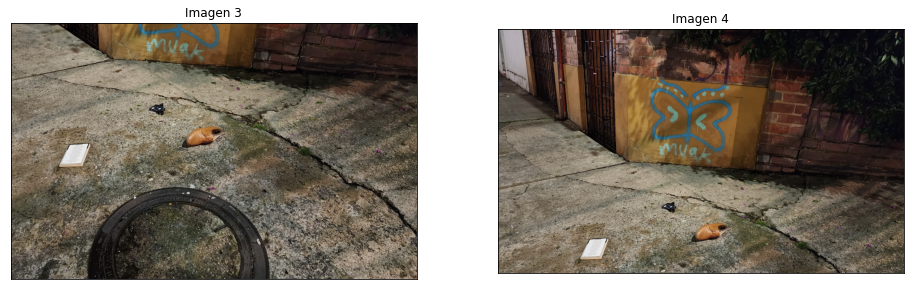

In [46]:
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Imagen 3')
plt.imshow(img_rgb3)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Imagen 4')
plt.imshow(img_rgb4)
plt.xticks([]), plt.yticks([])

plt.show()

In [47]:
img5=cv2.imread('img5.jpg')
img_rgb5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

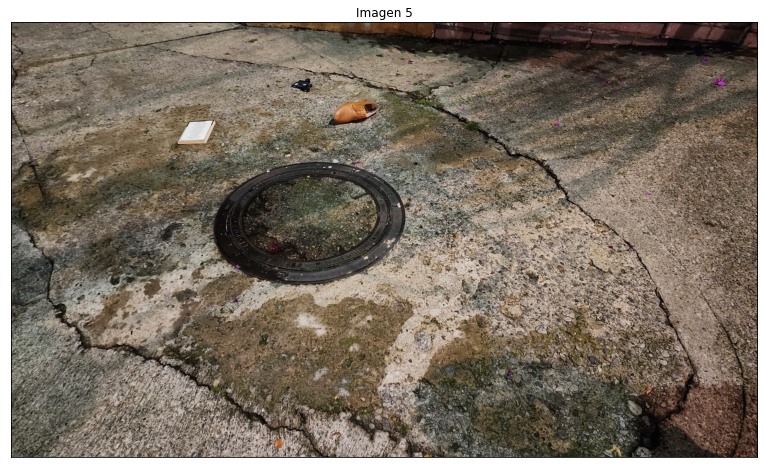

In [48]:
plt.figure(figsize=(16,8))

plt.title('Imagen 5')
plt.imshow(img_rgb5)
plt.xticks([]), plt.yticks([])


plt.show()

### SIFT

## IMAGEN 1

In [49]:
sift= cv2.SIFT_create()

[keypoints1, descriptors1] = sift.detectAndCompute(img_rgb1, None)
print("Puntos de interes imagen1: ", format(len(keypoints1)))
print("Descriptores imagen1: ", format(len(descriptors1)))

[keypoints3, descriptors3] = sift.detectAndCompute(img_rgb3, None)
print("Puntos de interes imagen3: ", format(len(keypoints3)))
print("Descriptores imagen3: ", format(len(descriptors3)))

Puntos de interes imagen1:  21319
Descriptores imagen1:  21319
Puntos de interes imagen3:  23941
Descriptores imagen3:  23941


Visualización

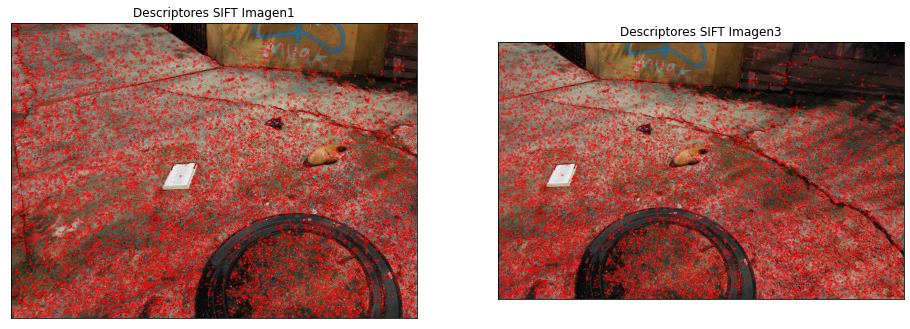

In [50]:
img_rgb_kp1= cv2.drawKeypoints(img_rgb1, keypoints1, None, color=(255,0,0)) 
img_rgb_kp3= cv2.drawKeypoints(img_rgb3, keypoints3, None, color=(255,0,0))

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Descriptores SIFT Imagen1')
plt.imshow(img_rgb_kp1)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Descriptores SIFT Imagen3')
plt.imshow(img_rgb_kp3)
plt.xticks([]), plt.yticks([])

plt.show()

### Brute Force

In [51]:
bf = cv2.BFMatcher(cv2.NORM_L1) 
matches = bf.knnMatch(descriptors1, descriptors3, k=2)

In [52]:
good = []
good_homography = []
for m,n in matches:
    if m.distance < 0.65*n.distance: #umbral distancia máxima
        good.append([m])
        good_homography.append(m)

print("puntos de interes emparejados: ", format(len(good)) )

puntos de interes emparejados:  12551


Visualización puntos de interes emparejados

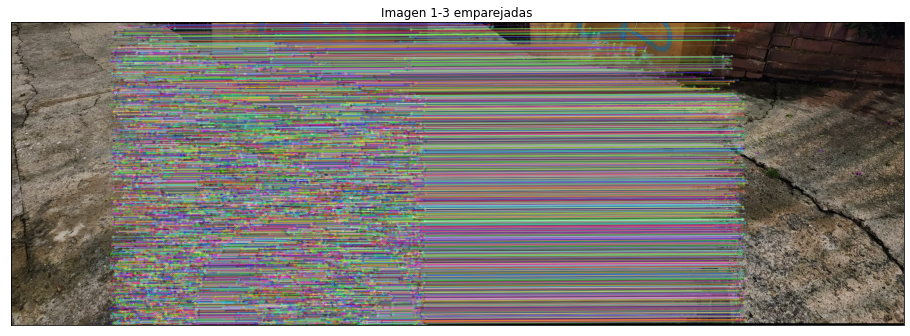

In [53]:
img1_emparejados=cv2.drawMatchesKnn(img_rgb1, keypoints1, img_rgb3, keypoints3, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16,8))
plt.imshow(img1_emparejados)
plt.title('Imagen 1-3 emparejadas')
plt.xticks([]), plt.yticks([])
plt.show()

### Estimación de Homografía

In [54]:
orig_pts= np.float32([keypoints1[m.queryIdx].pt for m in good_homography ]).reshape(-1,1,2)
dest_pts= np.float32([keypoints3[m.trainIdx].pt for m in good_homography ]).reshape(-1,1,2)

Estimar homografia y mostrar matriz de transformación

In [55]:
method = cv2.RANSAC
[MT, _] = cv2.findHomography(orig_pts, dest_pts, method, 5.0)

print("Matriz de transformación de perspectiva:")
print(MT)

Matriz de transformación de perspectiva:
[[ 9.99983220e-01 -3.19246181e-06 -3.41989124e+02]
 [-2.62959767e-06  9.99993281e-01 -5.99827638e+00]
 [-5.80409428e-09 -6.26934163e-09  1.00000000e+00]]


## STITCHING

Referencia

In [56]:
images=[]
images.append(img_rgb1)
images.append(img_rgb2)
images.append(img_rgb3)
images.append(img_rgb4)
images.append(img_rgb5)

stitchy = cv2.Stitcher.create()
(_, output)=stitchy.stitch(images)

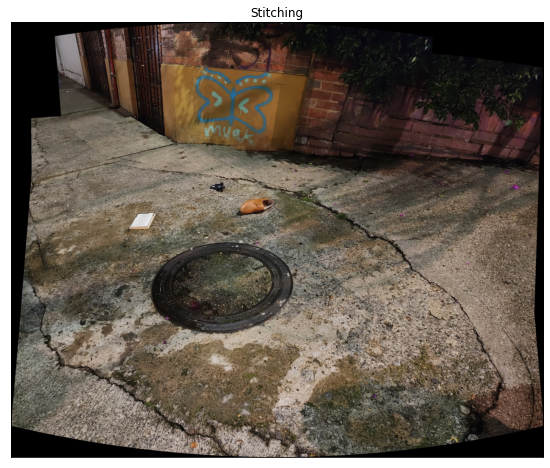

In [57]:
plt.figure(figsize=(16,8))
plt.imshow(output)
plt.title('Stitching')
plt.xticks([]), plt.yticks([])
plt.show()

Imagen 1 e Imagen 3

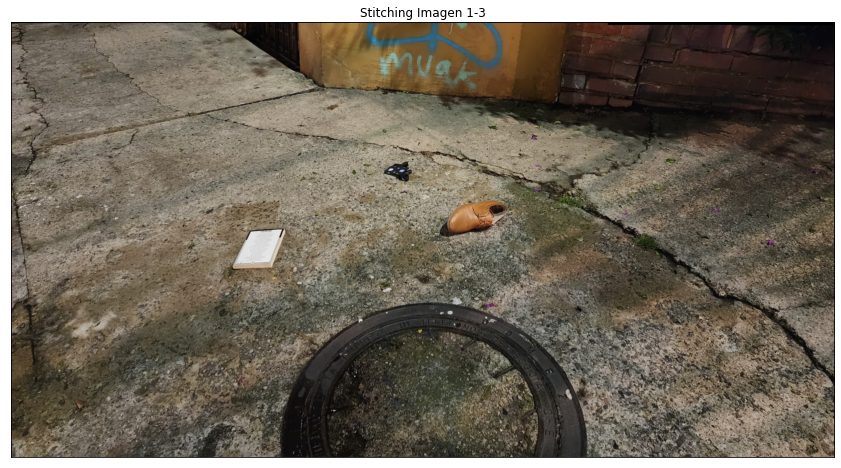

In [58]:
images=[]
images.append(img_rgb1)
images.append(img_rgb3)


stitchy = cv2.Stitcher.create()
(_, output1)=stitchy.stitch(images)

plt.figure(figsize=(16,8))
plt.imshow(output1)
plt.title('Stitching Imagen 1-3')
plt.xticks([]), plt.yticks([])
plt.show()

# Imagen 2

SIFT 1-3 Y 4

In [59]:
sift= cv2.SIFT_create()

[keypoints_o1, descriptors_o1] = sift.detectAndCompute(output1, None)
print("Puntos de interes stitching1: ", format(len(keypoints_o1)))
print("Descriptores stitching1: ", format(len(descriptors_o1)))

[keypoints4, descriptors4] = sift.detectAndCompute(img_rgb4, None)
print("Puntos de interes imagen4: ", format(len(keypoints4)))
print("Descriptores imagen4: ", format(len(descriptors4)))

Puntos de interes stitching1:  32646
Descriptores stitching1:  32646
Puntos de interes imagen4:  15289
Descriptores imagen4:  15289


Visualización en RGB de todas las características (puntos de interés)
encontradas sin flags

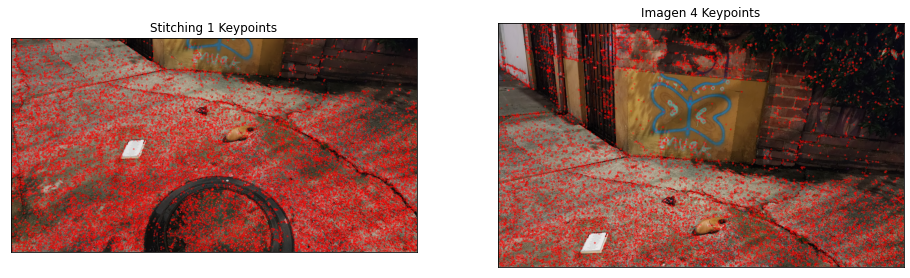

In [60]:
img_rgb_kp_o1= cv2.drawKeypoints(output1, keypoints_o1, None, color=(255,0,0)) 
img_rgb_kp2= cv2.drawKeypoints(img_rgb4, keypoints4, None, color=(255,0,0))

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Stitching 1 Keypoints')
plt.imshow(img_rgb_kp_o1)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Imagen 4 Keypoints')
plt.imshow(img_rgb_kp2)
plt.xticks([]), plt.yticks([])

plt.show()

### Brute Force

In [61]:
bf = cv2.BFMatcher(cv2.NORM_L1) 
matches = bf.knnMatch(descriptors_o1, descriptors4, k=2)

In [62]:
good = []
good_homography = []
for m,n in matches:
    if m.distance < 0.65*n.distance: #umbral distancia máxima
        good.append([m])
        good_homography.append(m)

print("puntos de interes emparejados: ", format(len(good)) )

puntos de interes emparejados:  7478


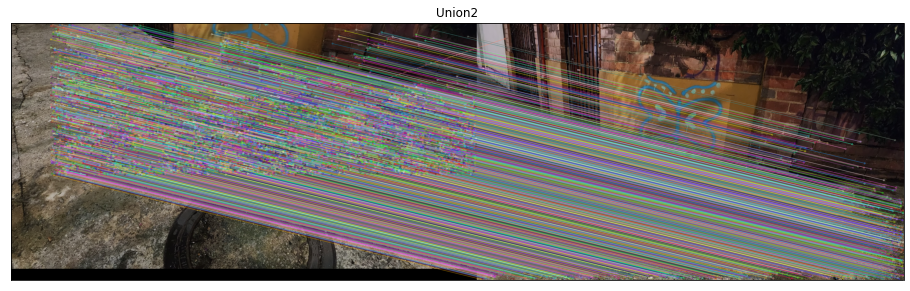

In [63]:
img2_emparejados=cv2.drawMatchesKnn(output1, keypoints_o1, img_rgb4, keypoints4, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16,8))
plt.imshow(img2_emparejados)
plt.title('Union2')
plt.xticks([]), plt.yticks([])
plt.show()

### Estimación de Homografía

In [64]:
orig_pts= np.float32([keypoints_o1[m.queryIdx].pt for m in good_homography ]).reshape(-1,1,2)
dest_pts= np.float32([keypoints4[m.trainIdx].pt for m in good_homography ]).reshape(-1,1,2)

In [65]:
method = cv2.RANSAC
[MT, _] = cv2.findHomography(orig_pts, dest_pts, method, 5.0)

print("Matriz de transformación de perspectiva:")
print(MT)

Matriz de transformación de perspectiva:
[[ 1.00012259e+00 -1.05400129e-04 -1.66483711e+02]
 [-1.74824958e-04  1.00039921e+00  4.43108492e+02]
 [-6.88763234e-08 -2.03537202e-07  1.00000000e+00]]


## STITCHING

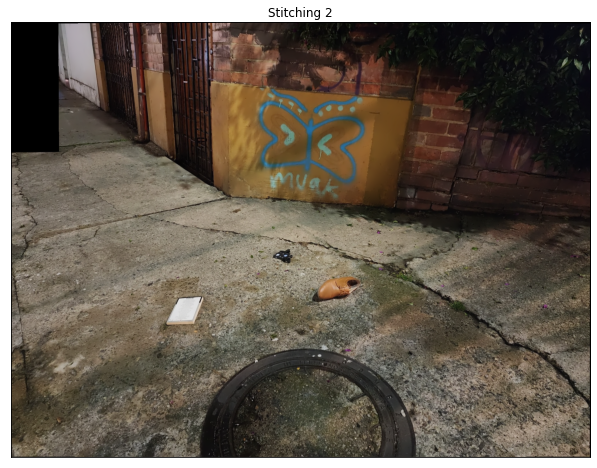

In [66]:
images=[]
images.append(output1) #output1: Img1-Img3
images.append(img_rgb4)

stitchy = cv2.Stitcher.create()
(_, output2)=stitchy.stitch(images)

plt.figure(figsize=(16,8))
plt.imshow(output2)
plt.title('Stitching 2')
plt.xticks([]), plt.yticks([])
plt.show()

## Union Imagen 2 y 5

SIFT 2 y 5

In [67]:
sift= cv2.SIFT_create()

[keypoints2, descriptors2] = sift.detectAndCompute(img_rgb2, None)
print("Puntos de interes imagen2: ", format(len(keypoints2)))
print("Descriptores Imagen2: ", format(len(descriptors2)))

[keypoints5, descriptors5] = sift.detectAndCompute(img_rgb5, None)
print("Puntos de interes imagen5: ", format(len(keypoints5)))
print("Descriptores imagen5: ", format(len(descriptors5)))

Puntos de interes imagen2:  21821
Descriptores Imagen2:  21821
Puntos de interes imagen5:  44464
Descriptores imagen5:  44464


Visualización en RGB de todas las características (puntos de interés)
encontradas sin flags

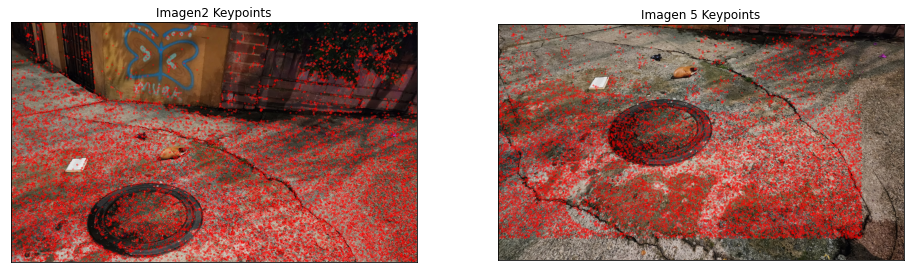

In [68]:
img_rgb_kp2= cv2.drawKeypoints(img_rgb2, keypoints2, None, color=(255,0,0)) #visualiza las regiones de interes
img_rgb_kp5= cv2.drawKeypoints(img_rgb5, keypoints2, None, color=(255,0,0))

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Imagen2 Keypoints')
plt.imshow(img_rgb_kp2)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Imagen 5 Keypoints')
plt.imshow(img_rgb_kp5)
plt.xticks([]), plt.yticks([])

plt.show()

### BruteForce

In [69]:
bf = cv2.BFMatcher(cv2.NORM_L1) 
matches = bf.knnMatch(descriptors2, descriptors5, k=2)

In [70]:
good = []
good_homography = []
for m,n in matches:
    if m.distance < 0.65*n.distance: #umbral distancia máxima
        good.append([m])
        good_homography.append(m)

print("puntos de interes emparejados: ", format(len(good)) )

puntos de interes emparejados:  16266


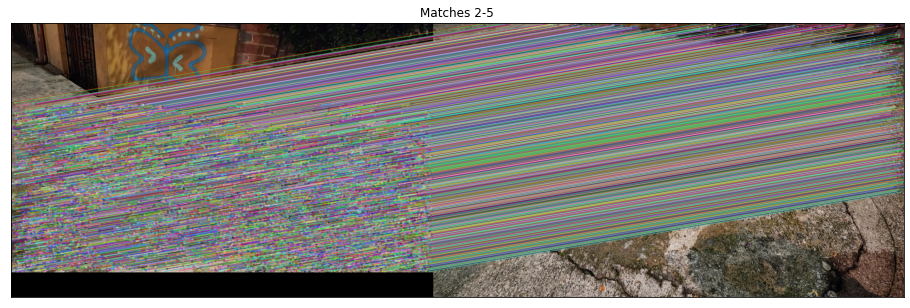

In [71]:
img3_emparejados=cv2.drawMatchesKnn(img_rgb2, keypoints2, img_rgb5, keypoints5, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16,8))
plt.imshow(img3_emparejados)
plt.title('Matches 2-5')
plt.xticks([]), plt.yticks([])
plt.show()

### Estimación Homografica

In [72]:
orig_pts= np.float32([keypoints2[m.queryIdx].pt for m in good_homography ]).reshape(-1,1,2)
dest_pts= np.float32([keypoints5[m.trainIdx].pt for m in good_homography ]).reshape(-1,1,2)

In [73]:
method = cv2.RANSAC
[MT, _] = cv2.findHomography(orig_pts, dest_pts, method, 5.0)

print("Matriz de transformación de perspectiva:")
print(MT)


Matriz de transformación de perspectiva:
[[ 9.99998015e-01  1.52125553e-07  2.05997905e+02]
 [ 7.10460631e-08  9.99997294e-01 -3.35999465e+02]
 [-4.34824838e-10 -2.98178746e-09  1.00000000e+00]]


### Stitching

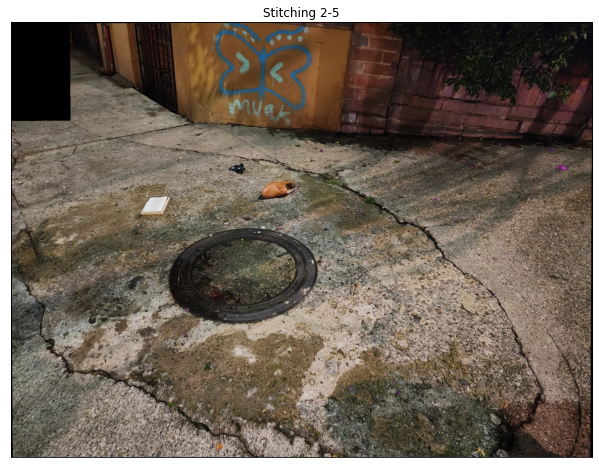

In [74]:
images=[]
images.append(img_rgb2)
images.append(img_rgb5)

stitchy = cv2.Stitcher.create()
(_, output3)=stitchy.stitch(images)

plt.figure(figsize=(16,8))
plt.imshow(output3)
plt.title('Stitching 2-5')
plt.xticks([]), plt.yticks([])
plt.show()

## Union total: ( Output2 U Output3) 
Es decir ((img1 U img3) U img4) U (img2 U img5)

In [75]:
sift= cv2.SIFT_create()

[keypoints_o2, descriptors_o2] = sift.detectAndCompute(output2, None)
print("Puntos de interes Stitching (1-3)-4: ", format(len(keypoints_o2)))
print("Descriptores Stitching (1-3)-4: ", format(len(descriptors_o2)))

[keypoints_o3, descriptors_o3] = sift.detectAndCompute(output3, None)
print("Puntos de interes Stitching 2-5: ", format(len(keypoints_o3)))
print("Descriptores Stitching 2-5: ", format(len(descriptors_o3)))

Puntos de interes Stitching (1-3)-4:  32342
Descriptores Stitching (1-3)-4:  32342
Puntos de interes Stitching 2-5:  49521
Descriptores Stitching 2-5:  49521


Visualización en RGB de todas las características (puntos de interés)
encontradas sin flags

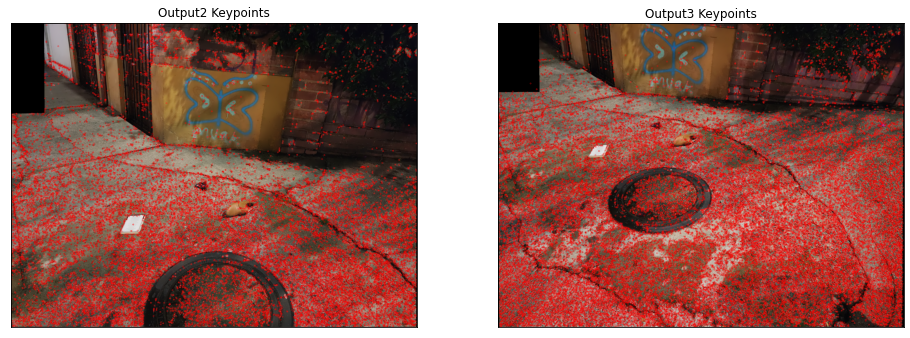

In [76]:
img_rgb_kp_o2= cv2.drawKeypoints(output2, keypoints_o2, None, color=(255,0,0)) 
img_rgb_kp_o3= cv2.drawKeypoints(output3, keypoints_o3, None, color=(255,0,0))

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Output2 Keypoints')
plt.imshow(img_rgb_kp_o2)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Output3 Keypoints')
plt.imshow(img_rgb_kp_o3)
plt.xticks([]), plt.yticks([])

plt.show()

## Brute Force:

In [77]:
bf = cv2.BFMatcher(cv2.NORM_L1) 
matches = bf.knnMatch(descriptors_o2, descriptors_o3, k=2)

In [78]:
good = []
good_homography = []
for m,n in matches:
    if m.distance < 0.65*n.distance: #umbral distancia máxima
        good.append([m])
        good_homography.append(m)

print("puntos de interes emparejados: ", format(len(good)) )

puntos de interes emparejados:  1812


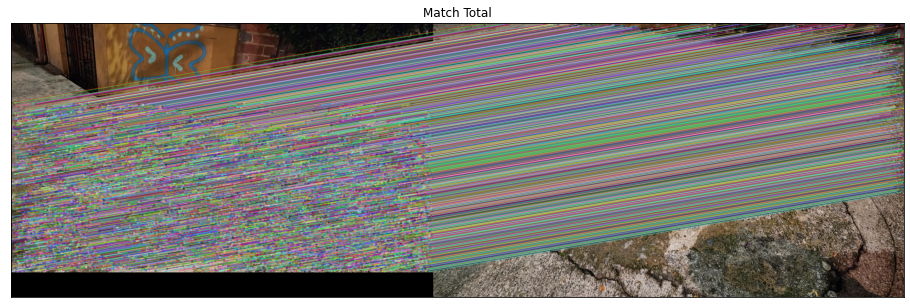

In [79]:
img4_emparejados=cv2.drawMatchesKnn(output2, keypoints_o2, output3, keypoints_o3, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16,8))
plt.imshow(img3_emparejados)
plt.title('Match Total')
plt.xticks([]), plt.yticks([])
plt.show()

### Estimación Homografica

In [80]:
orig_pts= np.float32([keypoints_o2[m.queryIdx].pt for m in good_homography ]).reshape(-1,1,2)
dest_pts= np.float32([keypoints_o3[m.trainIdx].pt for m in good_homography ]).reshape(-1,1,2)

In [81]:
method = cv2.RANSAC
[MT, _] = cv2.findHomography(orig_pts, dest_pts, method, 5.0)

print("Matriz de transformación de perspectiva:")
print(MT)


Matriz de transformación de perspectiva:
[[ 1.21236461e+00  2.59818143e-01 -2.49967208e+02]
 [ 1.60612126e-02  1.23280145e+00 -2.98933809e+02]
 [ 3.42966256e-05  4.57408447e-04  1.00000000e+00]]


### Stitching

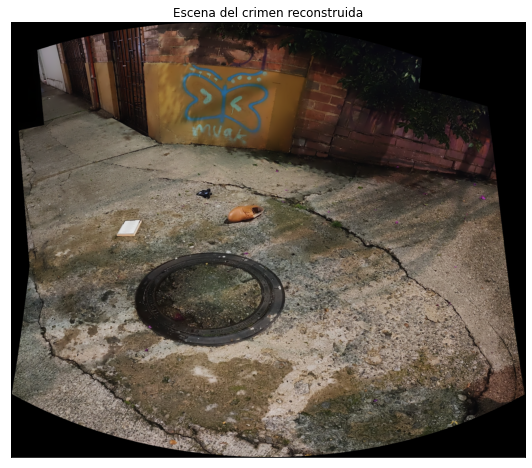

In [82]:
images=[]
images.append(output2)
images.append(output3)

stitchy = cv2.Stitcher.create()
(_, final)=stitchy.stitch(images)

plt.figure(figsize=(16,8))
plt.imshow(final)
plt.title('Escena del crimen reconstruida')
plt.xticks([]), plt.yticks([])
plt.show()